## Anchor Direction Visualization Framework: DeepSurv trained on the SUPPORT dataset (where the encoder has a Euclidean norm 1 constraint)

We apply our visualization framework to a DeepSurv model with an encoder that is constrained to output Euclidean vectors with norm 1. This model has been trained on the tabular [SUPPORT](https://hbiostat.org/data/) dataset.

### Loading in data (including some outputs from the already trained neural survival analysis model)

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = ['sans-serif', 'Arial']
matplotlib.rcParams['text.usetex'] = False
matplotlib.rcParams['mathtext.fontset'] = 'stixsans'
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

import numpy as np
import pandas as pd
import scipy.stats

from visualization_utils import get_experiment_data, l2_normalize_rows, longest_common_prefix, \
    compute_median_survival_times

Some explanation of the variables below:

- `emb_direction`: these are embedding vectors for anchor direction estimation data
- `emb_vis`: these are embedding vectors for the visualization raw inputs
- `raw_direction`: raw inputs of the anchor direction estimation data
- `raw_vis`: visualization raw inputs
- `label_direction`: survival labels (2 columns: column 0 stores observed times and column 1 stores event indicators) of the anchor direction estimation data
- `label_vis`: survival labels of the visualization raw inputs
- `unique_train_times`: discretized time grid used for the predicted survival curves
- `predicted_surv_vis`: predicted survival curves of the visualization raw inputs (so each visualization raw input has a predicted survival curve that is specified for the time grid given by `unique_train_times`

In [2]:
emb_direction, emb_vis, raw_direction, raw_vis, label_direction, label_vis, \
    _, unique_train_times, predicted_surv_vis \
        = get_experiment_data('support', '../train_models/output_tabular_hypersphere')

For example, in this case, there are 665 anchor estimation data points and the embedding dimension is 10:

In [3]:
emb_direction.shape

(665, 10)

### 2D PCA plot of the visualization data

Euclidean vectors with norm 1 reside on what is called the "unit hypersphere" $\mathcal{S}^{d-1}\triangleq\{v\in\mathbb{R}^d: \|v\|=1\}$. When we take data on the unit hypersphere and plot their 2D PCA plot, the resulting 2D PCA plot should always look like points that are within a 2D circle. This plot could be helpful. We can readily tell if the data appear uniformly distributed over a hypersphere or not. For example, if you see a 2D circle with points everywhere, then that would suggest that the embedding vectors are distributed across the whole hypersphere (in the higher dimension space that they actually reside in). In this case, the points largely bunches up on one side of a circle, meaning that in the embedding space (that in this case is actually 10-dimensional), the points largely are concentrated around a hyperspherical cap.

We color the points in the PCA plot based on their predicted median survival times.

In [4]:
median_surv_time_estimates = compute_median_survival_times(predicted_surv_vis, unique_train_times)

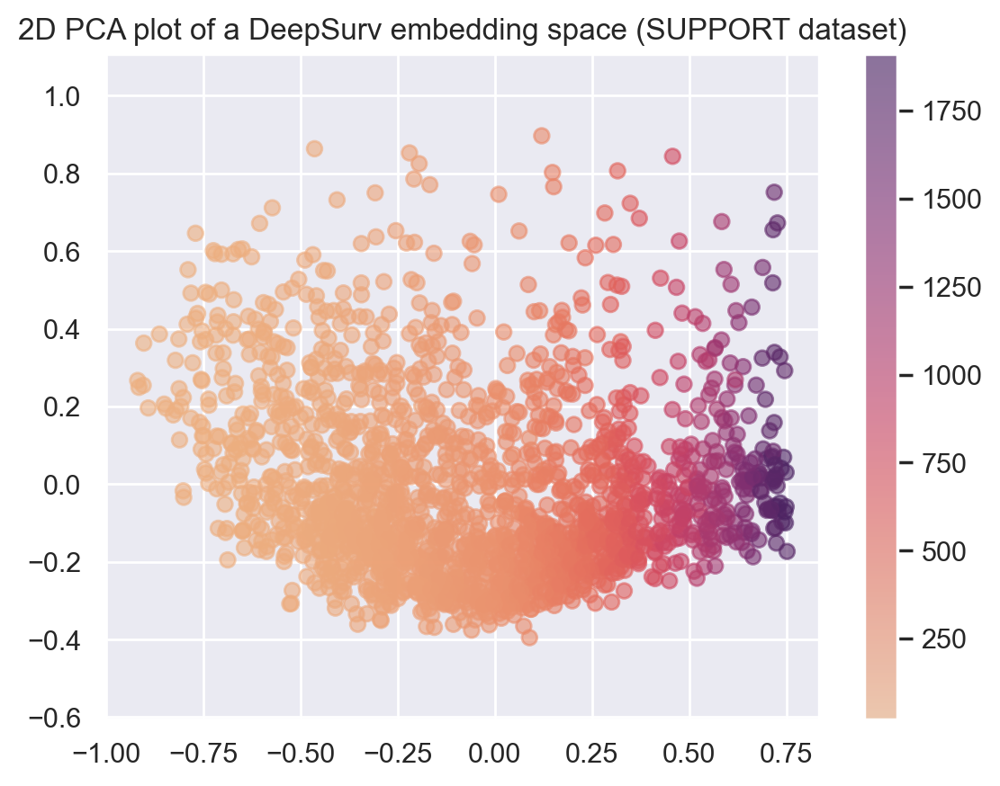

In [5]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
emb_vis_pca_2d = pca.fit_transform(emb_vis)
plt.axis('equal')
plt.scatter(emb_vis_pca_2d[:, 0], emb_vis_pca_2d[:, 1], alpha=.6, c=median_surv_time_estimates, cmap='flare')
plt.colorbar()
plt.title('2D PCA plot of a DeepSurv embedding space (SUPPORT dataset)')
plt.savefig('support-embedding-space-pca-hypersphere.pdf', bbox_inches='tight')

### 2D t-SNE plot of the visualization data

Instead of using PCA, we could also use t-SNE.

/home/george/anaconda3_UDA/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/george/anaconda3_UDA/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


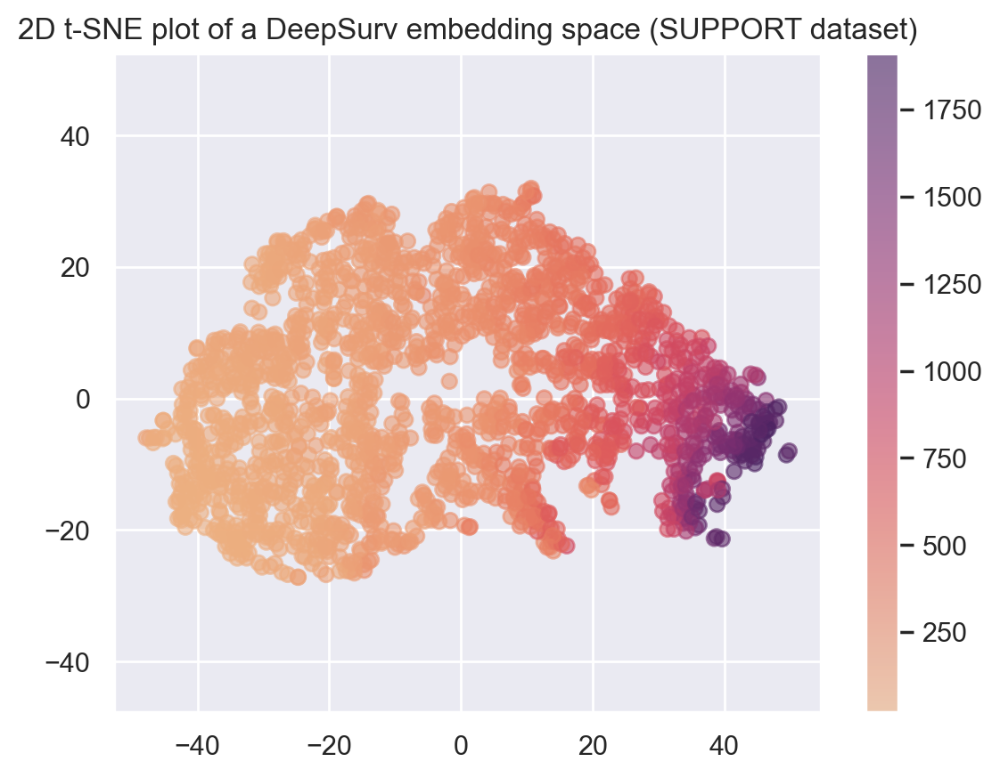

In [6]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=50, random_state=3676767249)
emb_vis_tsne_2d = tsne.fit_transform(emb_vis)
plt.axis('equal')
plt.scatter(emb_vis_tsne_2d[:, 0], emb_vis_tsne_2d[:, 1], alpha=.6, c=median_surv_time_estimates, cmap='flare')
plt.colorbar()
plt.title('2D t-SNE plot of a DeepSurv embedding space (SUPPORT dataset)')
plt.savefig('support-embedding-space-tsne-hypersphere.pdf', bbox_inches='tight')

### For different choices for the number of components, fit a mixture of von Mises-Fisher distributions

We use the Expectation-Maximization algorithm implementation by Minyoung Kim: https://github.com/minyoungkim21/vmf-lib

In [7]:
from lifelines.statistics import pairwise_logrank_test
import random
import torch

import models
import utils

seed = 1861600023

n_init = 100
n_clusters_to_try = list(range(2, 11))
logrank_p_values = []
cluster_assignments = []
cluster_models = []
samples = torch.tensor(emb_direction, dtype=torch.float32)
opts = {}
opts['max_iters'] = 100  # maximum number of EM iterations
opts['rll_tol'] = 1e-5  # tolerance of relative loglik improvement
for n_clusters in n_clusters_to_try:
    print('Trying %d clusters...' % n_clusters)

    best_ll = -np.inf
    best_cluster_assignment = None
    for repeat_idx in range(n_init):
        random.seed(seed + repeat_idx)
        np.random.seed(seed + repeat_idx)
        torch.manual_seed(seed + repeat_idx)
        torch.cuda.manual_seed(seed + repeat_idx)
        torch.cuda.manual_seed_all(seed + repeat_idx)

        # create a model
        mix = models.MixvMF(x_dim=emb_direction.shape[1], order=n_clusters)

        # EM learning
        ll_old = -np.inf
        with torch.no_grad():

            for steps in range(opts['max_iters']):

                # E-step
                logalpha, mus, kappas = mix.get_params()
                logliks, logpcs = mix(samples)
                ll = logliks.sum()
                jll = logalpha.unsqueeze(0) + logpcs
                qz = jll.log_softmax(1).exp()

                # tolerance check
                if steps > 0:
                    rll = (ll-ll_old).abs() / (ll_old.abs()+utils.realmin)
                    if rll < opts['rll_tol']:
                        break

                ll_old = ll

                # M-step
                qzx = ( qz.unsqueeze(2) * samples.unsqueeze(1) ).sum(0)
                qzx_norms = utils.norm(qzx, dim=1)
                mus_new = qzx / qzx_norms
                Rs = qzx_norms[:,0] / (qz.sum(0) + utils.realmin)
                kappas_new = (mix.x_dim*Rs - Rs**3) / (1 - Rs**2 + 1e-6)
                alpha_new = qz.sum(0) / samples.shape[0]

                # assign new params
                mix.set_params(alpha_new, mus_new, kappas_new)

            logliks, logpcs = mix(samples)
            ll = logliks.sum()
            if ll > best_ll:
                best_ll = ll
                best_cluster_assignment = np.argmax(logpcs.numpy(), axis=1)

    result = pairwise_logrank_test(label_direction[:, 0],
                                   best_cluster_assignment,
                                   label_direction[:, 1])
    logrank_p_values.append(result.p_value)
    cluster_assignments.append(best_cluster_assignment)

Trying 2 clusters...
Trying 3 clusters...
Trying 4 clusters...
Trying 5 clusters...
Trying 6 clusters...
Trying 7 clusters...
Trying 8 clusters...
Trying 9 clusters...
Trying 10 clusters...


Below, we make a violin plot for helping us select the number of clusters to use.

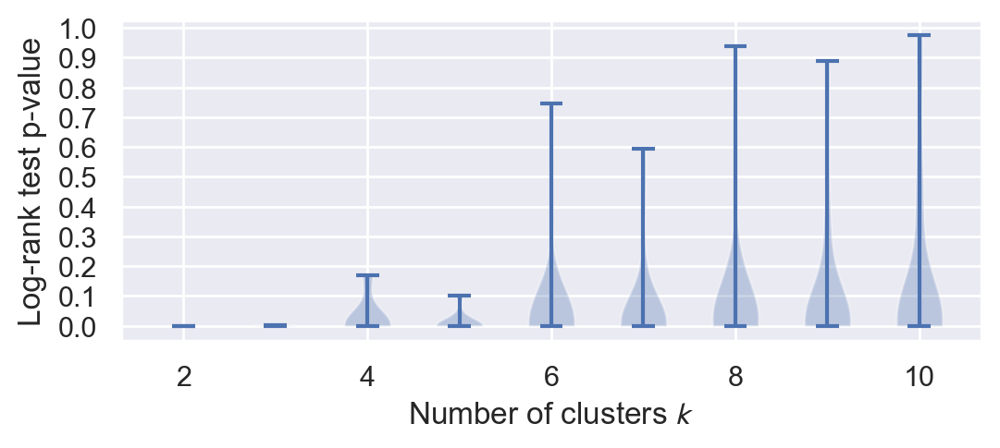

In [8]:
plt.figure(figsize=(6, 2.25))
plt.violinplot(logrank_p_values, n_clusters_to_try)
plt.xlabel('Number of clusters $k$')
plt.ylabel('Log-rank test p-value')
plt.yticks(np.linspace(0, 1, 11))
plt.savefig('support-logrank-pvalue-vs-nclusters-hypersphere.pdf', bbox_inches='tight')

### Using different clusters' anchor directions, make various visualizations

In [9]:
final_n_clusters = 5

In [10]:
final_cluster_assignment = cluster_assignments[n_clusters_to_try.index(final_n_clusters)]

/home/george/anaconda3_UDA/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Raw count')

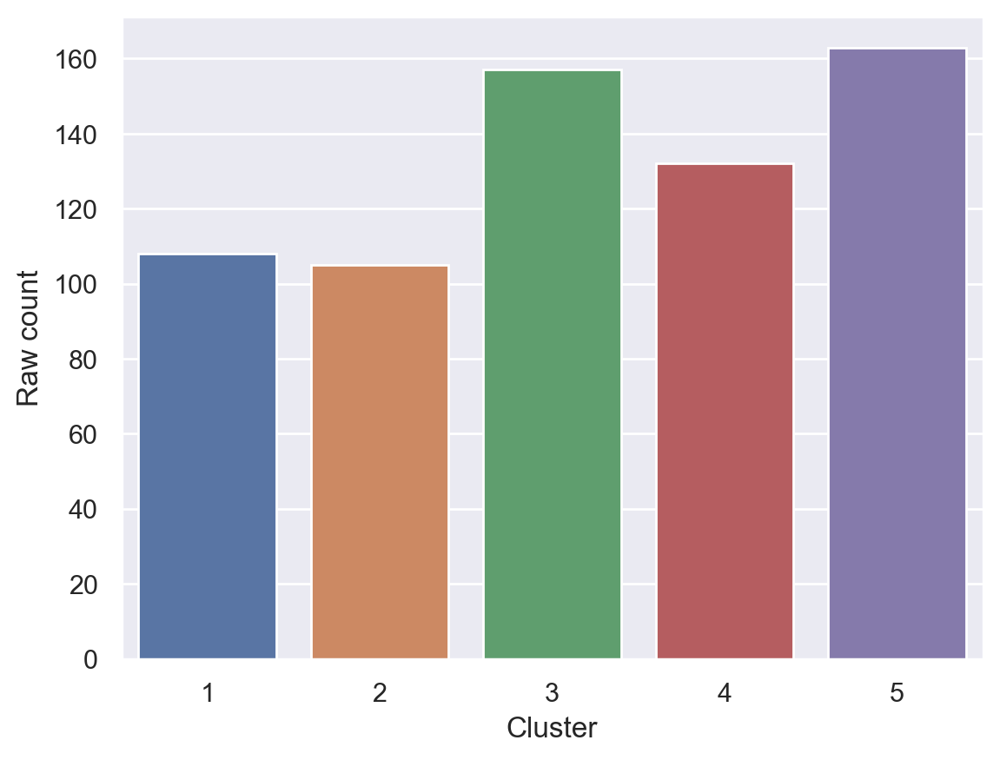

In [11]:
from collections import Counter
histogram = Counter(final_cluster_assignment)
sns.barplot(np.arange(final_n_clusters) + 1,
            [histogram[cluster_idx] for cluster_idx in range(final_n_clusters)])
plt.xlabel('Cluster')
plt.ylabel('Raw count')

In [12]:
center_of_mass = emb_direction.mean(axis=0)

In [13]:
anchor_directions = np.array([emb_direction[final_cluster_assignment == cluster_idx].mean(axis=0) - center_of_mass
                              for cluster_idx in range(final_n_clusters)])

In [14]:
# code that discretizes the all raw features (discrete and continuous) for raw feature probability heatmap
# visualizations (this code is specific to the SUPPORT dataset but can be modified for other tabular data)

from sklearn.preprocessing import KBinsDiscretizer, OneHotEncoder

def transform(raw_features, continuous_n_bins=5):
    feature_names = ['age', 'female', 'race', 'number of comorbidities',
                     'diabetes', 'dementia', 'cancer', 'mean arterial blood pressure',
                     'heart rate', 'respiration rate', 'temperature', 'white blood count',
                     'serum sodium', 'serum creatinine']
    binary_indices = [1, 4, 5]
    continuous_indices = [0, 3, 7, 8, 9, 10, 11, 12, 13]
    discretized_features = []
    discretized_feature_names = []
    all_n_bins_to_use = []
    for idx in continuous_indices:
        n_bins_to_use = continuous_n_bins
        discretizer = KBinsDiscretizer(n_bins=n_bins_to_use,
                                       strategy='quantile',
                                       encode='onehot-dense')
        new_features = discretizer.fit_transform(raw_features[:, idx].reshape(-1, 1).astype(float))
        if discretizer.n_bins_[0] != n_bins_to_use:
            n_bins_to_use = discretizer.n_bins_[0]

        if n_bins_to_use > 1:
            discretized_features.append(new_features)
            for bin_idx in range(n_bins_to_use):
                if bin_idx == 0:
                    discretized_feature_names.append(feature_names[idx] + ' bin#1(-inf,%.2f)' % discretizer.bin_edges_[0][bin_idx+1])
                elif bin_idx == n_bins_to_use - 1:
                    discretized_feature_names.append(feature_names[idx] + ' bin#%d[%.2f,inf)' % (n_bins_to_use, discretizer.bin_edges_[0][bin_idx]))
                else:
                    # print(discretizer.bin_edges_[0][bin_idx:bin_idx+2])
                    discretized_feature_names.append(feature_names[idx] + ' bin#%d[%.2f,%.2f)' % tuple([bin_idx + 1] + list(discretizer.bin_edges_[0][bin_idx:bin_idx+2])))
        all_n_bins_to_use.append(n_bins_to_use)
    for idx in binary_indices:
        discretized_features.append(raw_features[:, idx].reshape(-1, 1).astype(float))
        discretized_feature_names.append(feature_names[idx])
        all_n_bins_to_use.append(1)

    # race
    discretizer = OneHotEncoder(sparse=False, categories=[[0, 1, 2, 3, 4, 5]])
    discretized_features.append(discretizer.fit_transform(raw_features[:, 2].reshape(-1, 1).astype(float)))
    discretized_feature_names.extend(['race cat#1(unspecified)',
                                      'race cat#2(asian)',
                                      'race cat#3(black)',
                                      'race cat#4(hispanic)',
                                      'race cat#5(other)',
                                      'race cat#6(white)'])
    all_n_bins_to_use.append(6)

    # cancer
    discretizer = OneHotEncoder(sparse=False, categories=[[0, 1, 2]])
    discretized_features.append(discretizer.fit_transform(raw_features[:, 6].reshape(-1, 1).astype(float)))
    discretized_feature_names.extend(['cancer cat#1(no)',
                                      'cancer cat#2(yes)',
                                      'cancer cat#3(metastatic)'])
    all_n_bins_to_use.append(3)
    return np.hstack(discretized_features), discretized_feature_names, all_n_bins_to_use

In [15]:
raw_vis_discretized, discretized_feature_names, all_n_bins_to_use = transform(raw_vis)

/home/george/anaconda3_UDA/lib/python3.9/site-packages/sklearn/preprocessing/_discretization.py:230: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(


For each cluster, rank raw features using p-values from the chi-squared test of independence (raw feature vs projection value along the current cluster's anchor direction):

In [16]:
all_raw_feature_probability_heatmaps = []
all_bin_edges = []

n_bins = 7
emb_vis_normalized = l2_normalize_rows(emb_vis - center_of_mass[np.newaxis, :])
anchor_directions_normalized = l2_normalize_rows(anchor_directions)
for cluster_idx in range(final_n_clusters):
    projections = np.dot(emb_vis_normalized, anchor_directions_normalized[cluster_idx])

    bin_counts, bin_edges = np.histogram(projections, bins=n_bins)
    bin_edges_copy_with_inf_right_edge = bin_edges.copy()
    bin_edges_copy_with_inf_right_edge[-1] = np.inf

    bin_assignments = np.digitize(projections, bin_edges_copy_with_inf_right_edge) - 1

    heatmap = np.zeros((len(discretized_feature_names), n_bins))
    for discretized_feature_idx in range(len(discretized_feature_names)):
        for projection_bin_idx in range(n_bins):
            heatmap[discretized_feature_idx, projection_bin_idx] = raw_vis_discretized[bin_assignments == projection_bin_idx][:, discretized_feature_idx].mean()

    all_raw_feature_probability_heatmaps.append(heatmap)
    all_bin_edges.append(bin_edges)

    # compute ranking table
    projection_bin_counts = np.array([(bin_assignments == bin_idx).sum() for bin_idx in range(n_bins)])
    print('[Cluster %d]' % (cluster_idx + 1))
    current_row = 0
    variable_pval_pairs = []
    for variable_idx in range(len(all_n_bins_to_use)):
        n_bins_to_use = all_n_bins_to_use[variable_idx]
        if n_bins_to_use >= 2:
            prefix = \
                longest_common_prefix([discretized_feature_names[idx]
                                       for idx in range(current_row,
                                                        current_row + n_bins_to_use)])
            if prefix.endswith('(') or prefix.endswith('['):
                prefix = prefix[:-1]
            if prefix.endswith(' cat#') or prefix.endswith(' bin#'):
                prefix = prefix[:-5]
            prefix = prefix.strip()
            res = scipy.stats.chi2_contingency(
                heatmap[current_row:(current_row + n_bins_to_use), :]
                * projection_bin_counts[np.newaxis, :])
            variable_pval_pairs.append((prefix, res[1]))
        else:
            indicator_row = heatmap[current_row:(current_row + n_bins_to_use), :]
            res = scipy.stats.chi2_contingency(
                np.array([[indicator_row, 1. - indicator_row]])
                * projection_bin_counts[np.newaxis, :])
            # print(discretized_feature_names[current_row], res[1])
            variable_pval_pairs.append((discretized_feature_names[current_row], res[1]))
        current_row += n_bins_to_use
    for idx, (variable_name, pval) in enumerate(sorted(variable_pval_pairs, key=lambda x: x[1])):
        print(idx + 1, '-', variable_name, '-', pval)
        # print('%d &' % (idx + 1), variable_name, (('& $%.2E' % pval).replace('E-', '\\times 10^{-') + '}$ \\\\').replace('^{-0', '^{-'))
    print()

[Cluster 1]
1 - cancer - 2.862815719280573e-225
2 - age - 1.0425251510303728e-45
3 - number of comorbidities - 1.910891732907196e-24
4 - mean arterial blood pressure - 9.246053632291714e-19
5 - diabetes - 2.4563241280743838e-14
6 - dementia - 4.1548546200763554e-11
7 - temperature - 1.583137164662316e-10
8 - heart rate - 3.3378005767429485e-09
9 - female - 1.0688585415653065e-06
10 - serum creatinine - 1.2117177769184729e-06
11 - race - 3.417906721130916e-05
12 - white blood count - 7.022935801028308e-05
13 - respiration rate - 0.0004540486702830819
14 - serum sodium - 0.061404098535271505

[Cluster 2]
1 - temperature - 6.730215537228906e-181
2 - age - 2.4160744501706286e-40
3 - serum sodium - 4.062774656977879e-37
4 - female - 6.423932531872314e-32
5 - cancer - 2.0913366384911587e-27
6 - mean arterial blood pressure - 3.011522668227271e-18
7 - respiration rate - 2.432629850090296e-12
8 - number of comorbidities - 3.8027882111590003e-08
9 - heart rate - 4.039419569424163e-08
10 - white

These are the projection bin edges, just for reference:

In [17]:
for cluster_idx in range(final_n_clusters):
    print(cluster_idx + 1, all_bin_edges[cluster_idx])

1 [-0.99378884 -0.70979893 -0.42580901 -0.14181909  0.14217082  0.42616074
  0.71015065  0.99414057]
2 [-0.93504225 -0.65984285 -0.38464346 -0.10944407  0.16575532  0.44095472
  0.71615411  0.9913535 ]
3 [-0.98552826 -0.70252325 -0.41951824 -0.13651323  0.14649178  0.42949679
  0.7125018   0.99550681]
4 [-0.99169828 -0.70739132 -0.42308436 -0.1387774   0.14552956  0.42983651
  0.71414347  0.99845043]
5 [-0.98837869 -0.70513769 -0.4218967  -0.1386557   0.14458529  0.42782629
  0.71106728  0.99430828]


Plot raw feature probability heatmaps (we show how to do this for one cluster at a time and altogether in one big plot):

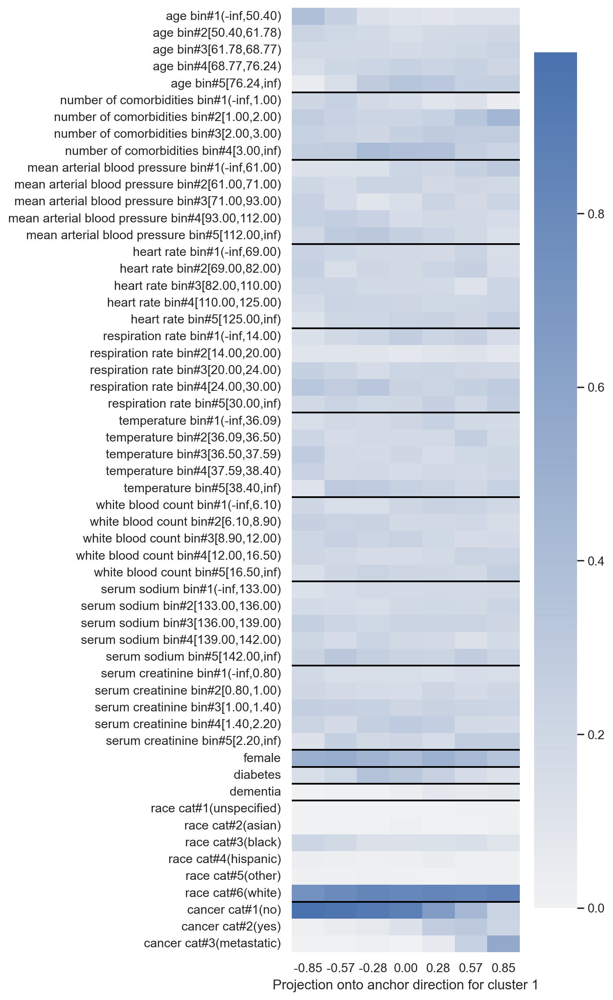

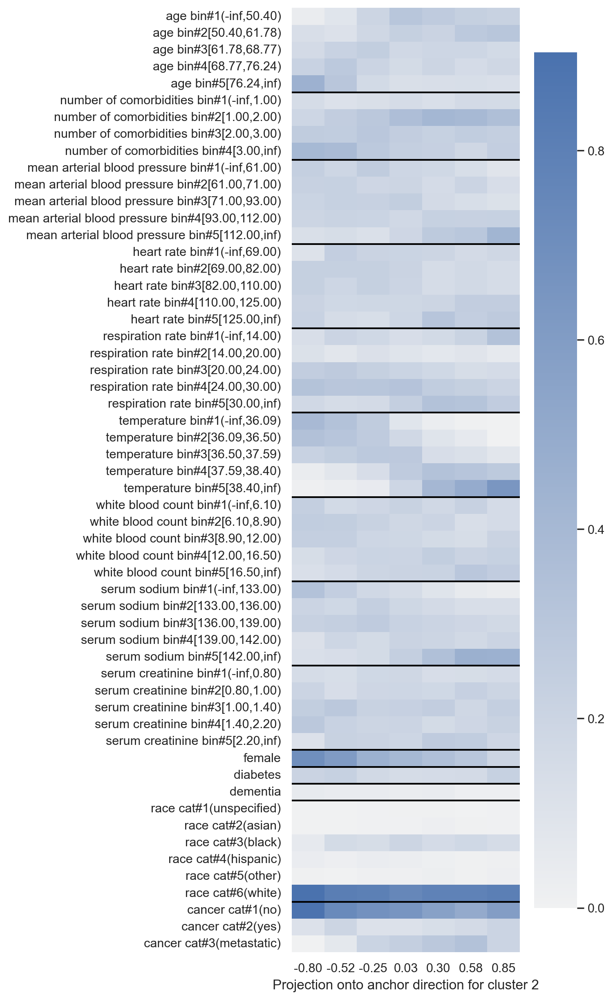

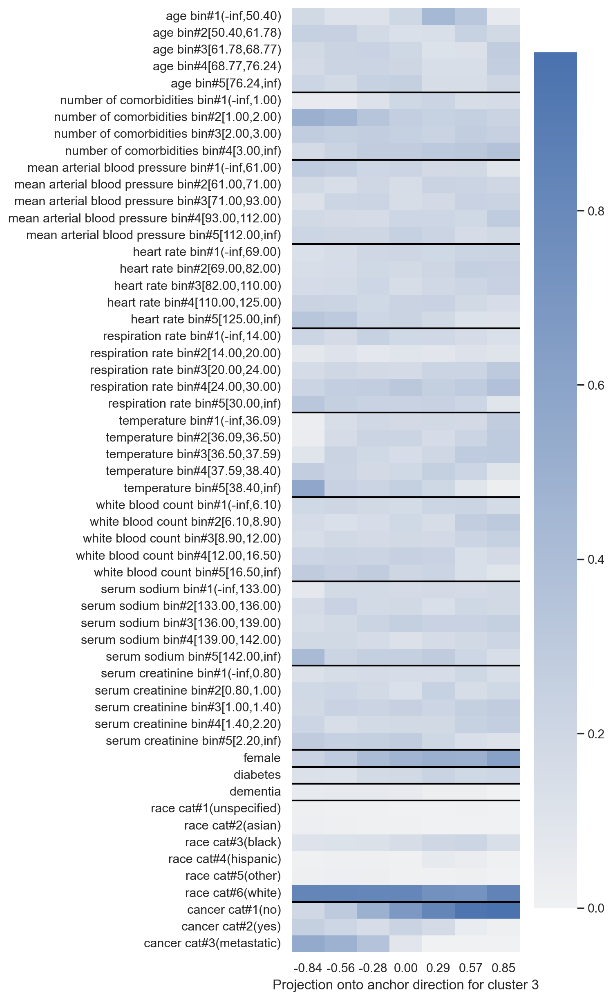

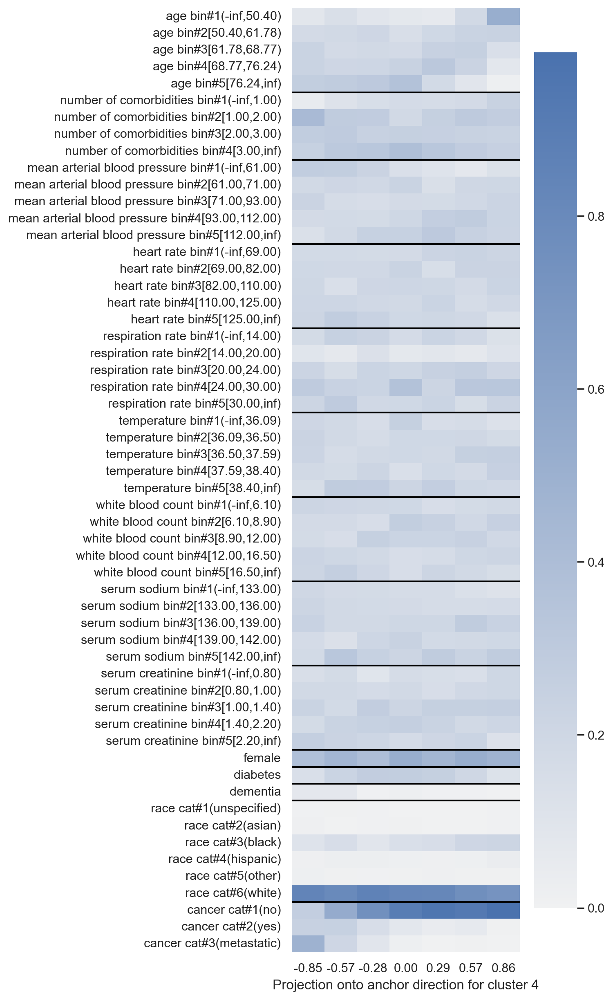

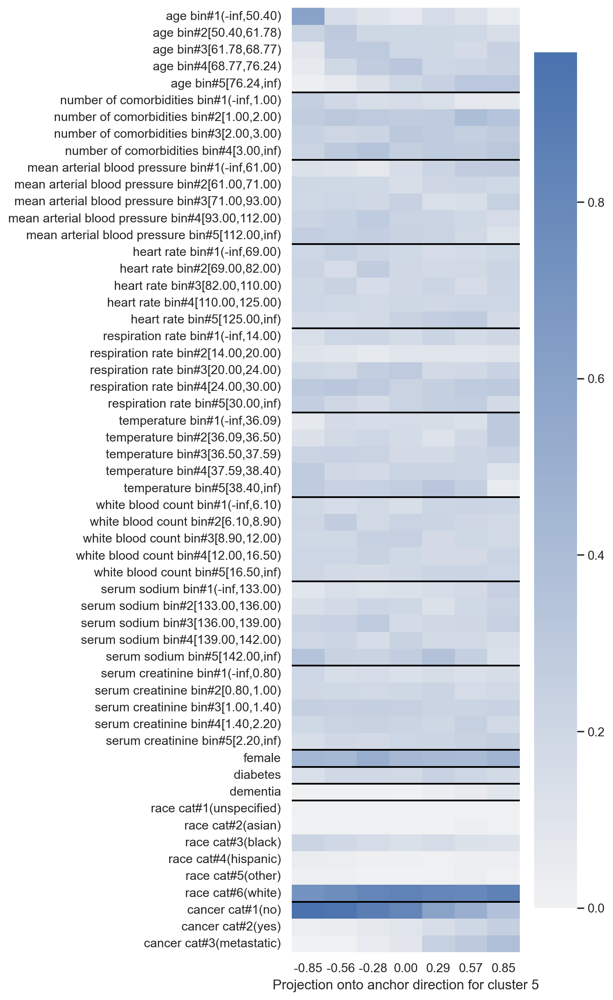

In [18]:
# plot one raw feature probability heatmap at a time

for cluster_idx in range(final_n_clusters):
    fig = plt.figure(figsize=(4.5, 15))
    ax = plt.subplot(111)

    # draw black lines separating raw features
    current_row = 0
    for idx, count in enumerate(all_n_bins_to_use[:-1]):
        current_row += count
        plt.plot([0, n_bins], [current_row, current_row], 'black')

    bin_edges = all_bin_edges[cluster_idx]
    sns.heatmap(pd.DataFrame(all_raw_feature_probability_heatmaps[cluster_idx],
                             index=discretized_feature_names,
                             columns=['%.2f' % x for x in (bin_edges[:-1] + bin_edges[1:])/2]),
                cmap=sns.light_palette("#4a72ae", reverse=False, as_cmap=True))
    plt.xlabel('Projection onto anchor direction for cluster %d' % (cluster_idx + 1))
    plt.savefig('support-anchor%d-raw-feature-prob-heatmap-hypersphere.pdf' % (cluster_idx + 1), bbox_inches='tight')

/tmp/ipykernel_4001238/1853827379.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1], pad=1.)


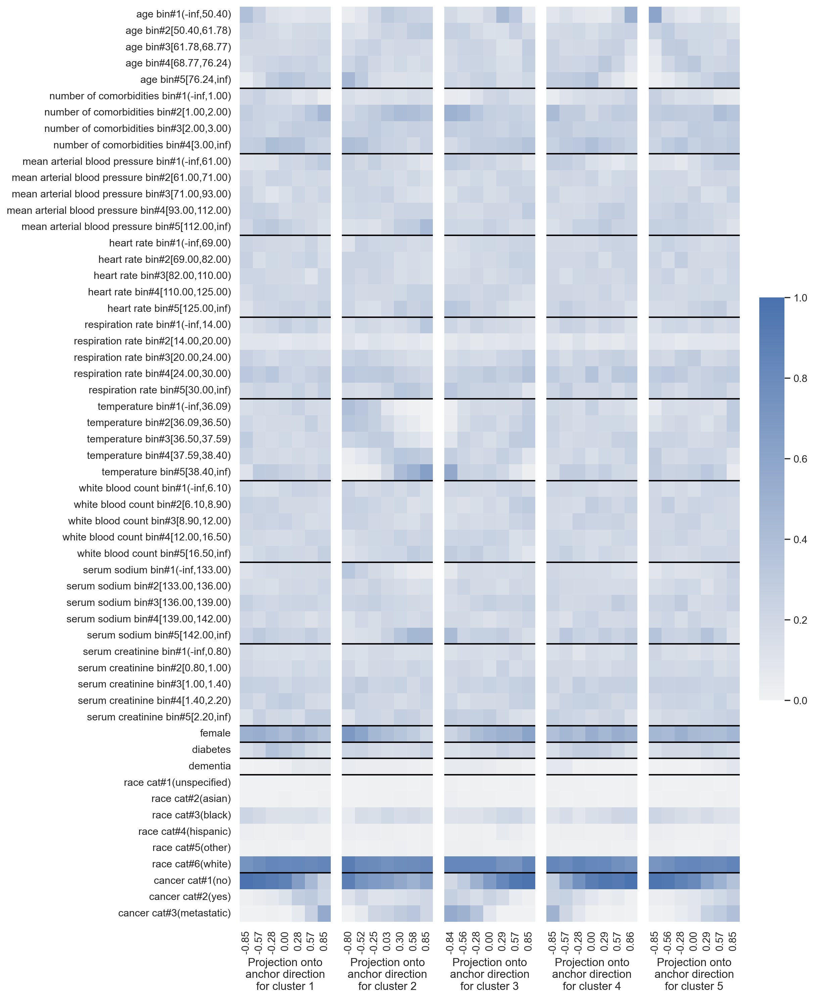

In [19]:
# plot all raw feature probability heatmaps together

n_bins = 7
fig, axn = plt.subplots(1, final_n_clusters, sharex=False, sharey=True, figsize=(12.5, 15))
cbar_ax = fig.add_axes([.91, .3, .03, .4])

for cluster_idx in range(final_n_clusters):
    ax = axn.flat[cluster_idx]
    current_row = 0
    for idx, count in enumerate(all_n_bins_to_use[:-1]):
        current_row += count
        ax.plot([0, n_bins], [current_row, current_row], 'black')
    sns.heatmap(pd.DataFrame(all_raw_feature_probability_heatmaps[cluster_idx],
                             index=discretized_feature_names,
                             columns=['%.2f' % x for x in (all_bin_edges[cluster_idx][:-1]
                                                           + all_bin_edges[cluster_idx][1:])/2]),
                ax=ax,
                cmap=sns.light_palette("#4a72ae", reverse=False, as_cmap=True),
                vmin=0, vmax=1,
                cbar=(cluster_idx == 0),
                cbar_ax=None if (cluster_idx != 0) else cbar_ax)
    ax.set_xlabel('Projection onto\nanchor direction\nfor cluster %d' % (cluster_idx + 1))
fig.tight_layout(rect=[0, 0, .9, 1], pad=1.)
plt.savefig('support-raw-feature-prob-heatmaps-hypersphere.pdf', bbox_inches='tight')

Plot survival probability heatmaps:

In [20]:
# compute survival probability heatmaps

from scipy import interpolate

n_rows = 10
discrete_time_grid = np.linspace(unique_train_times.min(), unique_train_times.max(), n_rows)

all_survival_probability_heatmaps = []
all_projection_bin_surv_curves = []
for cluster_idx in range(final_n_clusters):
    projections = np.dot(emb_vis_normalized, anchor_directions_normalized[cluster_idx])

    bin_counts, bin_edges = np.histogram(projections, bins=n_bins)
    bin_edges_copy_with_inf_right_edge = bin_edges.copy()
    bin_edges_copy_with_inf_right_edge[-1] = np.inf

    bin_assignments = np.digitize(projections, bin_edges_copy_with_inf_right_edge) - 1

    heatmap = np.zeros((n_rows, n_bins))
    projection_bin_surv_curves = []
    for projection_bin_idx in range(n_bins):
        projection_bin_surv = interpolate.interp1d(
            unique_train_times,
            predicted_surv_vis[bin_assignments == projection_bin_idx].mean(axis=0))
        projection_bin_surv_curves.append(
            predicted_surv_vis[bin_assignments == projection_bin_idx].mean(axis=0))
        heatmap[:, projection_bin_idx] = projection_bin_surv(discrete_time_grid)[::-1]

    all_survival_probability_heatmaps.append(heatmap)
    all_projection_bin_surv_curves.append(projection_bin_surv_curves)

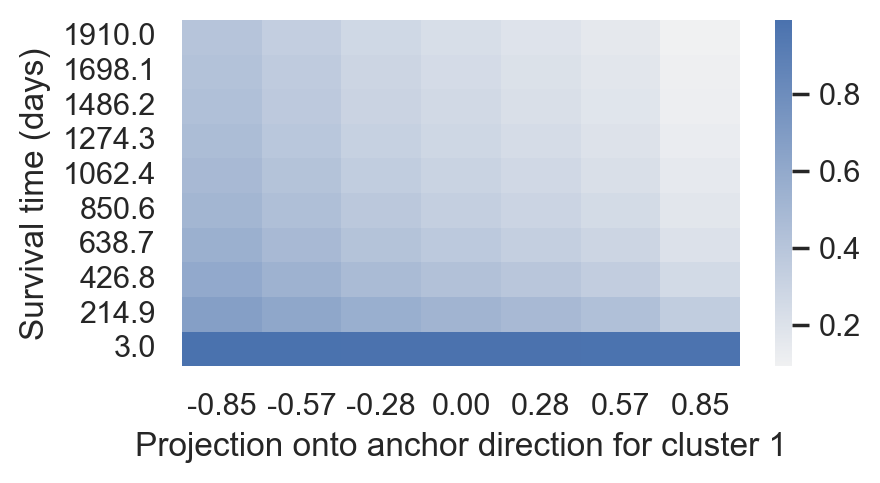

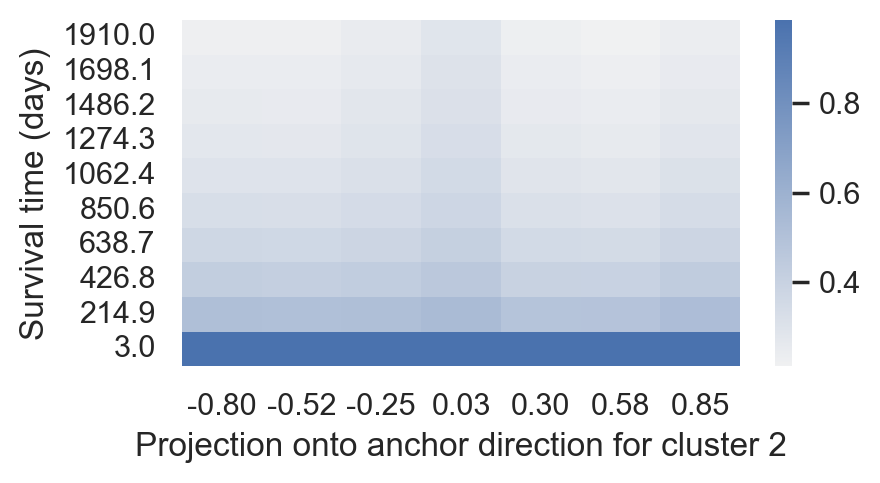

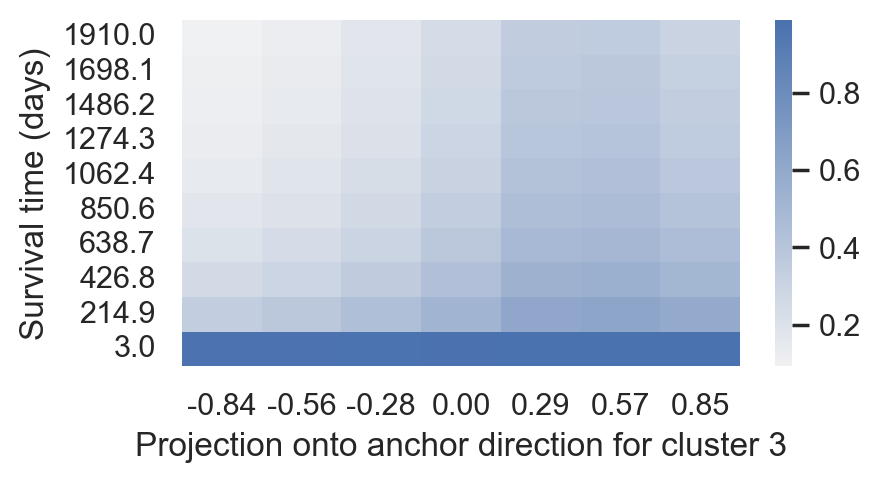

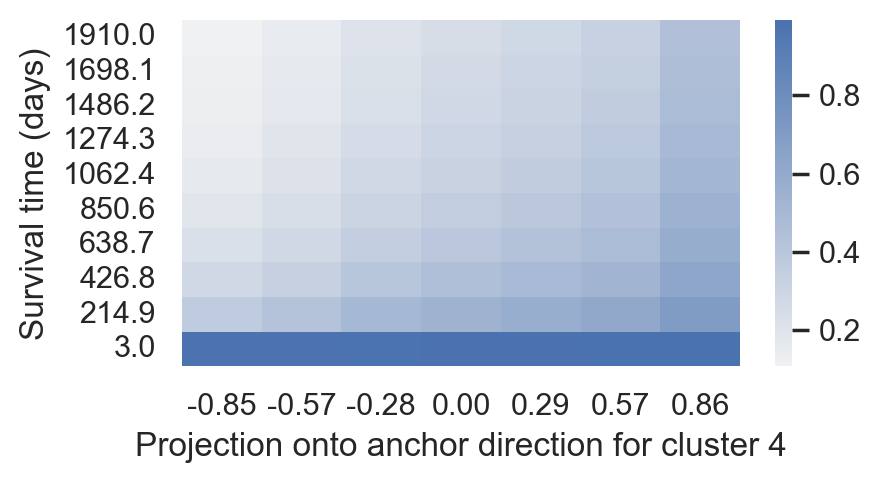

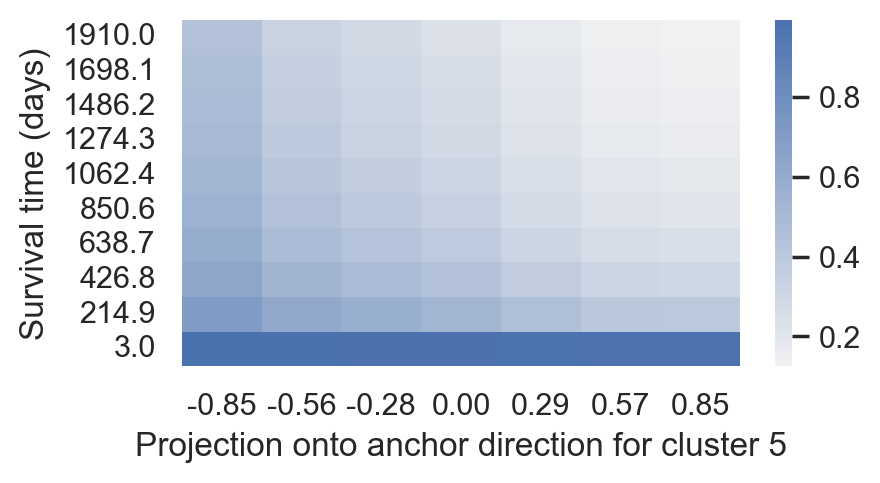

In [21]:
# plot one survival probability heatmap at a time

n_rows = 10
discrete_time_grid = np.linspace(unique_train_times.min(), unique_train_times.max(), n_rows)

for cluster_idx in range(final_n_clusters):
    fig = plt.figure(figsize=(4.5, 2.25))
    df = pd.DataFrame(all_survival_probability_heatmaps[cluster_idx],
                      index=['%.1f' % x for x in discrete_time_grid[::-1]],
                      columns=['%.2f' % x for x in (all_bin_edges[cluster_idx][:-1]
                                                    + all_bin_edges[cluster_idx][1:])/2])
    sns.heatmap(
        pd.DataFrame(all_survival_probability_heatmaps[cluster_idx],
                     index=['%.1f' % x for x in discrete_time_grid[::-1]],
                     columns=['%.2f' % x for x in (all_bin_edges[cluster_idx][:-1]
                                                   + all_bin_edges[cluster_idx][1:])/2]),
        cmap=sns.light_palette("#4a72ae", reverse=False, as_cmap=True))
    plt.xlabel('Projection onto anchor direction for cluster %d' % (cluster_idx + 1))
    plt.ylabel('Survival time (days)')
    plt.yticks(rotation=0) 
    plt.savefig('support-anchor%d-surv-prob-heatmap-hypersphere.pdf' % (cluster_idx + 1), bbox_inches='tight')

/tmp/ipykernel_4001238/3049816306.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1], pad=1.5)


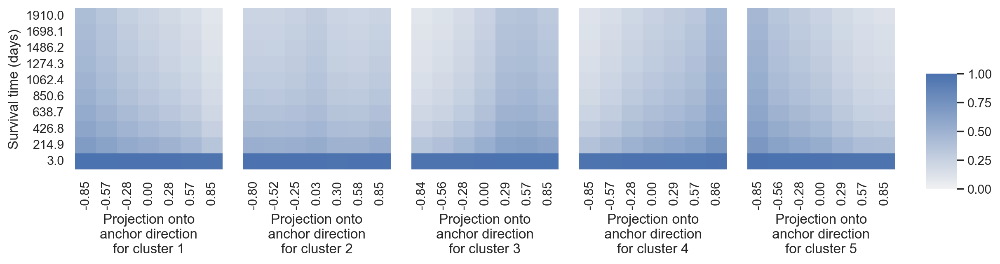

In [22]:
# plot all survival probability heatmaps

fig, axn = plt.subplots(1, final_n_clusters, sharex=False, sharey=True, figsize=(12.5, 3.5))
cbar_ax = fig.add_axes([.91, .3, .03, .4])

for cluster_idx in range(final_n_clusters):
    ax = axn.flat[cluster_idx]
    sns.heatmap(
        pd.DataFrame(all_survival_probability_heatmaps[cluster_idx],
                     index=['%.1f' % x for x in discrete_time_grid[::-1]],
                     columns=['%.2f' % x for x in (all_bin_edges[cluster_idx][:-1]
                                                   + all_bin_edges[cluster_idx][1:])/2]),
        cmap=sns.light_palette("#4a72ae", reverse=False, as_cmap=True),
        vmin=0, vmax=1, ax=ax,
        cbar=(cluster_idx == 0),
        cbar_ax=None if (cluster_idx != 0) else cbar_ax)
    ax.set_xlabel('Projection onto\nanchor direction\nfor cluster %d' % (cluster_idx + 1))
    if cluster_idx == 0:
        ax.set_ylabel('Survival time (days)')
fig.tight_layout(rect=[0, 0, .9, 1], pad=1.5)
plt.savefig('support-surv-prob-heatmaps-hypersphere.pdf', bbox_inches='tight')

For each cluster, plot a scatter plot of age vs projection value along the cluster's anchor direction:

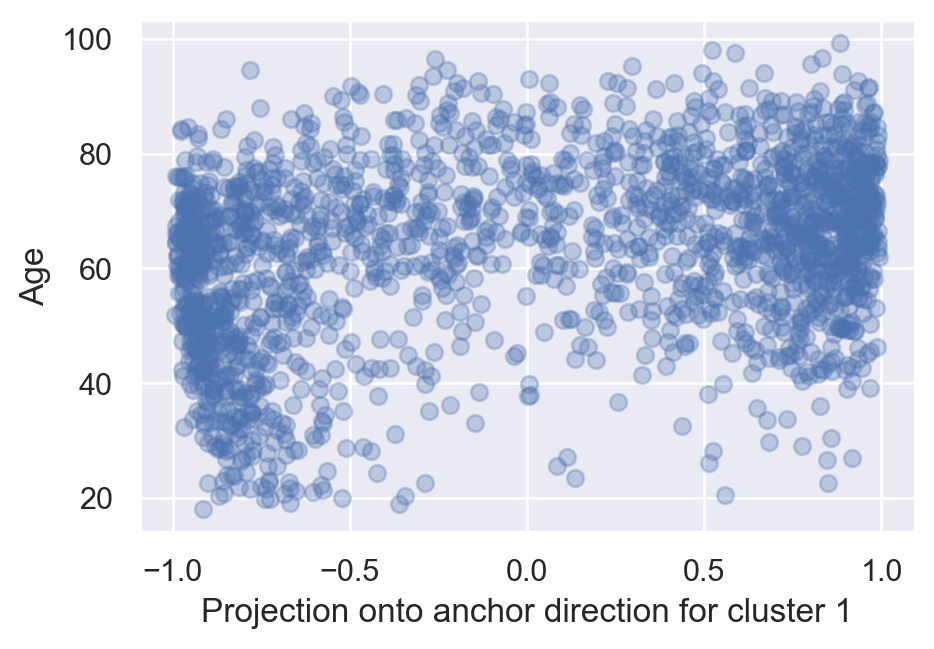

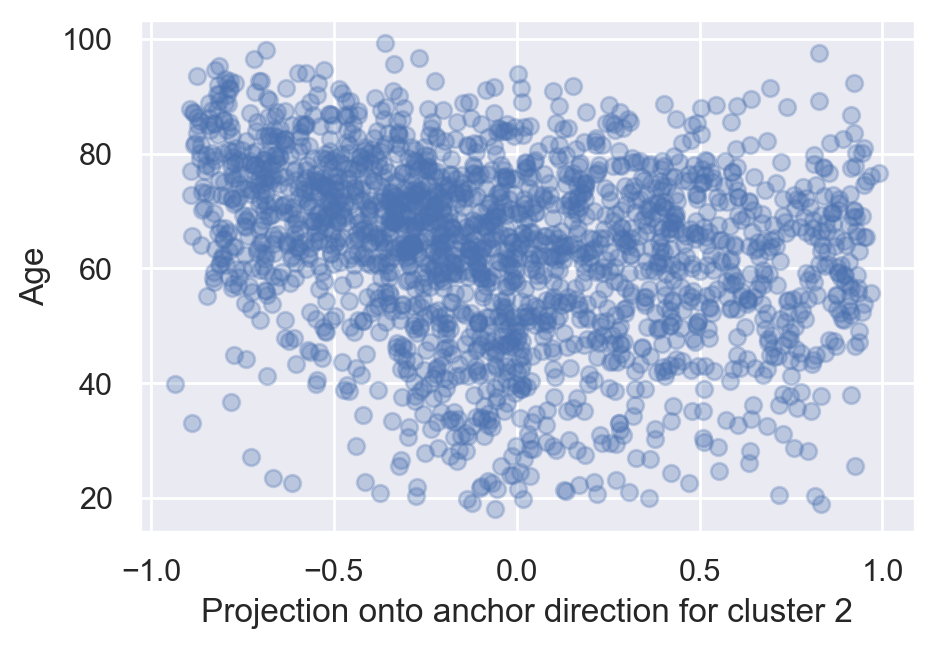

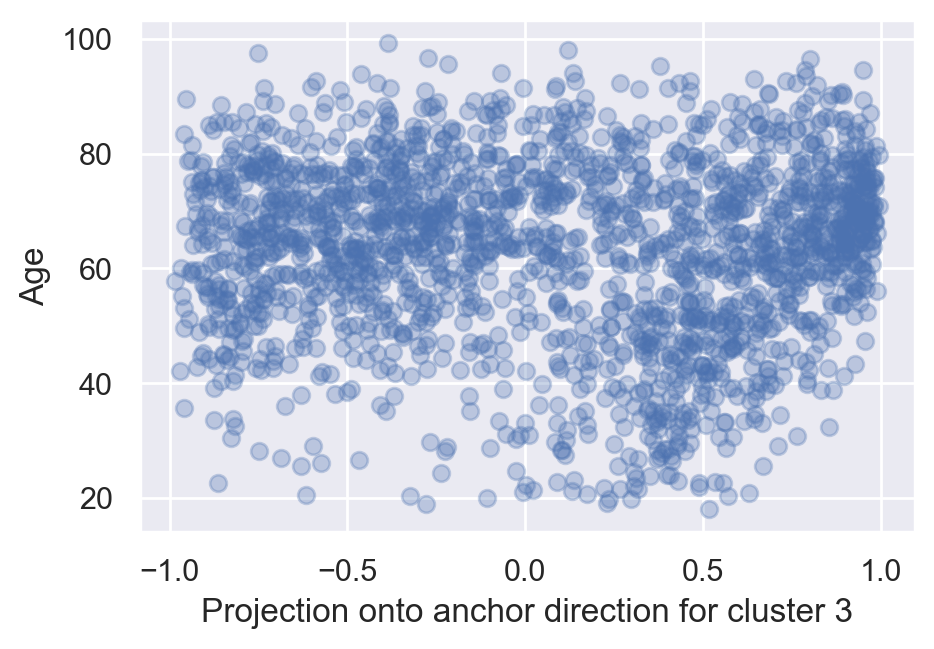

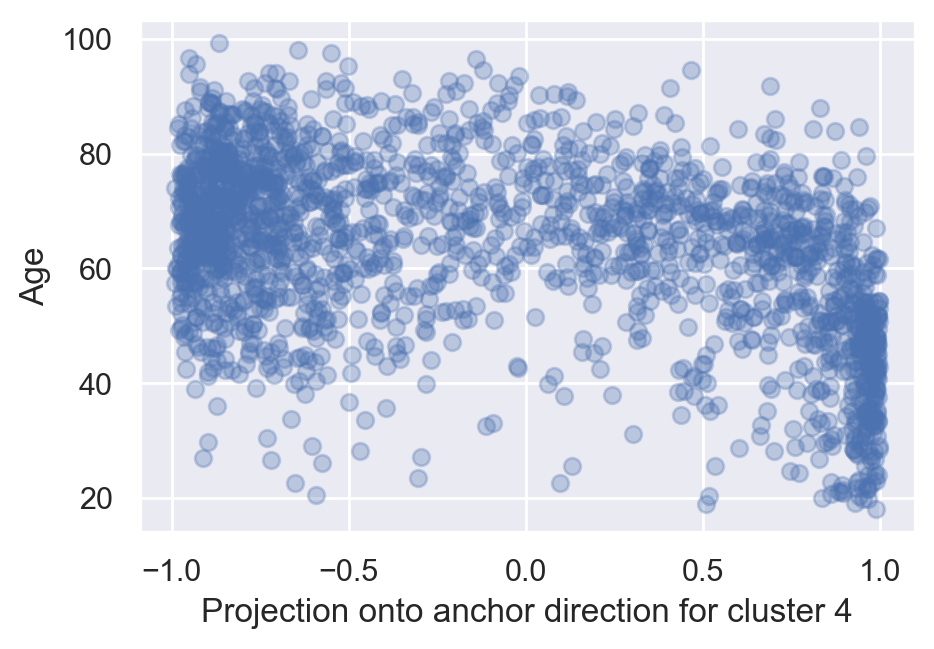

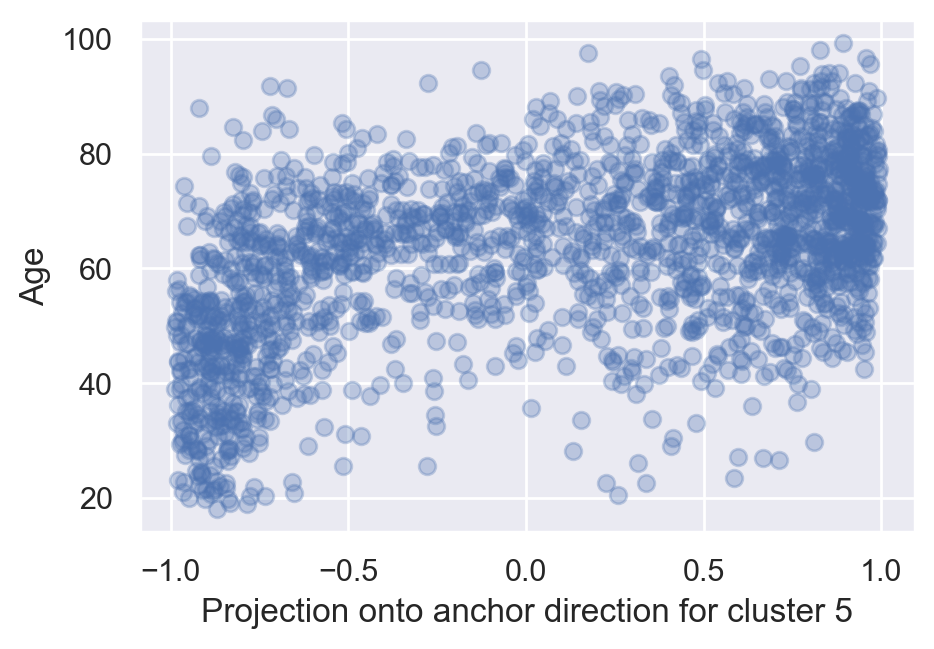

In [23]:
for cluster_idx in range(final_n_clusters):
    plt.figure(figsize=(5, 3.33))
    projections = np.dot(emb_vis_normalized, anchor_directions_normalized[cluster_idx])
    plt.scatter(projections, raw_vis[:, 0], alpha=.3)
    # sns.jointplot(projections, raw_vis[:, 0], kind="hist")
    plt.ylabel('Age')
    plt.xlabel('Projection onto anchor direction for cluster %d' % (cluster_idx + 1))
    plt.savefig('support-anchor%d-age-vs-proj-hypersphere.pdf' % (cluster_idx + 1), bbox_inches='tight')

### Ranking anchor directions based on median survival time

In [24]:
alpha = .1

# estimate a survival curve for the top alpha fraction of visualization data points per cluster/anchor direction
anchor_direction_median_survival_time_pairs = []
for cluster_idx in range(final_n_clusters):
    projections = np.dot(emb_vis_normalized, anchor_directions_normalized[cluster_idx])
    q_alpha = np.sort(projections)[int(np.ceil((1-alpha)*len(projections)))]

    surv_curv_alpha = predicted_surv_vis[projections >= q_alpha].mean(axis=0)
    median_surv_time_estimate = compute_median_survival_times(surv_curv_alpha, unique_train_times)
    anchor_direction_median_survival_time_pairs.append((cluster_idx, median_surv_time_estimate))

# sort anchor directions by median survival time estimates
sorted_anchor_direction_median_survival_time_pairs = \
    sorted(anchor_direction_median_survival_time_pairs, key=lambda x: x[1])
for cluster_idx, median_survival_time in sorted_anchor_direction_median_survival_time_pairs:
    print('Cluster', cluster_idx + 1, ': median survival time estimate', median_survival_time)

Cluster 1 : median survival time estimate 46.0
Cluster 5 : median survival time estimate 105.0
Cluster 2 : median survival time estimate 236.0
Cluster 3 : median survival time estimate 452.0
Cluster 4 : median survival time estimate 1895.0


### Feature interaction example

Here's an illustration of how to figure out possible feature interactions for each cluster's anchor direction. The basic idea: we train an "easy-to-interpret" regression model that maps from raw inputs to projection values for the anchor direction and where prediction allows for interactions. Here, we train a so-called *optimal regression tree* from the company Interpretable AI (requires a license). This method basically yields a single sparse tree where each leaf is determined by at most a few features (which are features that could have some interesting interaction). As we stated in our paper, we caution that these interactions should be interpreted with care (changing the max depth of the tree and using different random splits of the data for training and validation could potentially yield different trees and thus the interactions that get surfaced might not always be exactly the same).

In [25]:
from interpretableai import iai

raw_vis_race_onehot = np.hstack([raw_vis[:, [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]],
                                 1*(raw_vis[:, 2] == 0).reshape(-1, 1),
                                 1*(raw_vis[:, 2] == 1).reshape(-1, 1),
                                 1*(raw_vis[:, 2] == 2).reshape(-1, 1),
                                 1*(raw_vis[:, 2] == 3).reshape(-1, 1),
                                 1*(raw_vis[:, 2] == 4).reshape(-1, 1),
                                 1*(raw_vis[:, 2] == 5).reshape(-1, 1)])
columns = ['age',
           'female',
           'number of comorbidities',
           'diabetes',
           'dementia',
           'cancer',
           'mean arterial blood pressure',
           'heart rate',
           'respiration rate',
           'temperature',
           'white blood count',
           'serum sodium',
           'serum creatinine',
           'race (blank)',
           'race (Asian)',
           'race (black)',
           'race (hispanic)',
           'race (other)',
           'race (white)',
           'projection value']

def get_decision_tree(cluster_idx):
    projections = np.dot(emb_vis_normalized, anchor_directions_normalized[cluster_idx])
    df = pd.DataFrame(np.hstack((raw_vis_race_onehot, projections.reshape(-1, 1))),
                      columns=columns)
    X = df.iloc[:, 0:-1]
    y = df.iloc[:, -1]
    grid = iai.GridSearch(
        iai.OptimalTreeRegressor(
            random_seed=3943514174,
        ),
        max_depth=range(1, 4),
    )
    grid.fit_cv(X, y)
    learner = grid.get_learner()
    print(grid.get_learner())
    return learner

In [26]:
get_decision_tree(0)

[ Warning: This copy of Interpretable AI software is for academic purposes only and not for commercial use.


Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: age < 68.44
      3) Split: serum creatinine < 2.55
        4) Predict: -0.6306, 624 points, error 0.1933
        5) Predict: -0.112, 152 points, error 0.395
      6) Split: heart rate < 112.5
        7) Predict: -0.2025, 395 points, error 0.3326
        8) Predict: 0.3709, 160 points, error 0.2641
    9) Split: cancer < 1.5
      10) Split: age < 43.11
        11) Predict: -0.1099, 32 points, error 0.4126
        12) Predict: 0.6022, 249 points, error 0.1086
      13) Predict: 0.8038, 385 points, error 0.02707


Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: age < 68.44
      3) Split: serum creatinine < 2.55
        4) Predict: -0.6306, 624 points, error 0.1933
        5) Predict: -0.112, 152 points, error 0.395
      6) Split: heart rate < 112.5
        7) Predict: -0.2025, 395 points, error 0.3326
        8) Predict: 0.3709, 160 points, error 0.2641
    9) Split: cancer < 1.5
      10) Split: age < 43.11
        11) Predict: -0.1099, 32 points, error 0.4126
        12) Predict: 0.6022, 249 points, error 0.1086
      13) Predict: 0.8038, 385 points, error 0.02707

In [27]:
get_decision_tree(1)

Fitted OptimalTreeRegressor:
  1) Split: temperature < 37.25
    2) Split: cancer < 1.5
      3) Split: age < 55.11
        4) Predict: -0.1754, 230 points, error 0.0809
        5) Predict: -0.4465, 666 points, error 0.08797
      6) Split: age < 67.21
        7) Predict: 0.07864, 145 points, error 0.09305
        8) Predict: -0.1784, 91 points, error 0.05688
    9) Split: mean arterial blood pressure < 64.5
      10) Split: temperature < 38.64
        11) Predict: -0.0651, 164 points, error 0.1231
        12) Predict: 0.3123, 122 points, error 0.1164
      13) Split: female < 0.5
        14) Predict: 0.4915, 326 points, error 0.1056
        15) Predict: 0.2031, 253 points, error 0.1496


Fitted OptimalTreeRegressor:
  1) Split: temperature < 37.25
    2) Split: cancer < 1.5
      3) Split: age < 55.11
        4) Predict: -0.1754, 230 points, error 0.0809
        5) Predict: -0.4465, 666 points, error 0.08797
      6) Split: age < 67.21
        7) Predict: 0.07864, 145 points, error 0.09305
        8) Predict: -0.1784, 91 points, error 0.05688
    9) Split: mean arterial blood pressure < 64.5
      10) Split: temperature < 38.64
        11) Predict: -0.0651, 164 points, error 0.1231
        12) Predict: 0.3123, 122 points, error 0.1164
      13) Split: female < 0.5
        14) Predict: 0.4915, 326 points, error 0.1056
        15) Predict: 0.2031, 253 points, error 0.1496

In [28]:
get_decision_tree(2)

Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: temperature < 37.95
      3) Split: serum creatinine < 2.75
        4) Predict: 0.5799, 757 points, error 0.1207
        5) Predict: 0.1465, 150 points, error 0.2061
      6) Split: temperature < 38.95
        7) Predict: 0.1017, 293 points, error 0.1959
        8) Predict: -0.2868, 131 points, error 0.1913
    9) Split: temperature < 37.55
      10) Split: cancer < 1.5
        11) Predict: 0.008331, 157 points, error 0.1482
        12) Predict: -0.4343, 248 points, error 0.0475
      13) Predict: -0.67, 261 points, error 0.07767


Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: temperature < 37.95
      3) Split: serum creatinine < 2.75
        4) Predict: 0.5799, 757 points, error 0.1207
        5) Predict: 0.1465, 150 points, error 0.2061
      6) Split: temperature < 38.95
        7) Predict: 0.1017, 293 points, error 0.1959
        8) Predict: -0.2868, 131 points, error 0.1913
    9) Split: temperature < 37.55
      10) Split: cancer < 1.5
        11) Predict: 0.008331, 157 points, error 0.1482
        12) Predict: -0.4343, 248 points, error 0.0475
      13) Predict: -0.67, 261 points, error 0.07767

In [29]:
get_decision_tree(3)

Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: age < 74.54
      3) Split: age < 54.94
        4) Predict: 0.7223, 393 points, error 0.2002
        5) Predict: 0.1913, 592 points, error 0.33
      6) Split: heart rate < 100.5
        7) Predict: -0.1186, 208 points, error 0.2762
        8) Predict: -0.5581, 138 points, error 0.123
    9) Split: age < 37.99
      10) Predict: 0.08314, 31 points, error 0.4032
      11) Predict: -0.7606, 635 points, error 0.05579


Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: age < 74.54
      3) Split: age < 54.94
        4) Predict: 0.7223, 393 points, error 0.2002
        5) Predict: 0.1913, 592 points, error 0.33
      6) Split: heart rate < 100.5
        7) Predict: -0.1186, 208 points, error 0.2762
        8) Predict: -0.5581, 138 points, error 0.123
    9) Split: age < 37.99
      10) Predict: 0.08314, 31 points, error 0.4032
      11) Predict: -0.7606, 635 points, error 0.05579

In [30]:
get_decision_tree(4)

Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: age < 54.94
      3) Split: mean arterial blood pressure < 59.5
        4) Predict: -0.273, 74 points, error 0.4333
        5) Predict: -0.7519, 319 points, error 0.0775
      6) Split: age < 74.54
        7) Predict: -0.09627, 592 points, error 0.3132
        8) Predict: 0.41, 346 points, error 0.234
    9) Split: age < 37.99
      10) Predict: -0.2415, 31 points, error 0.347
      11) Split: temperature < 37.35
        12) Predict: 0.8107, 379 points, error 0.03989
        13) Predict: 0.4338, 256 points, error 0.1095


Fitted OptimalTreeRegressor:
  1) Split: cancer < 0.5
    2) Split: age < 54.94
      3) Split: mean arterial blood pressure < 59.5
        4) Predict: -0.273, 74 points, error 0.4333
        5) Predict: -0.7519, 319 points, error 0.0775
      6) Split: age < 74.54
        7) Predict: -0.09627, 592 points, error 0.3132
        8) Predict: 0.41, 346 points, error 0.234
    9) Split: age < 37.99
      10) Predict: -0.2415, 31 points, error 0.347
      11) Split: temperature < 37.35
        12) Predict: 0.8107, 379 points, error 0.03989
        13) Predict: 0.4338, 256 points, error 0.1095